### Coisas a fazer:
- Fazer undersampling básico para as classificações binárias

- Undersampling + Oversampling (zoom, virar, deslocar...) Para o modelo multi classes (os 93) podemos fazer até x10

- Dividir a imagem em Bins para analisar onde de acumula o hashing, usar como método de semelhança (isto não o percebo muito bem)

- Falamos nos blobs, mas eu interpreto que não é necessário (só se tivermos tempo)

- Usar padding mínimo se fazemos CNN com imagens rectangulares

- Modelo com autoencoder pode ser menos interessante

- Começar com as imagens menos resolutivas e redes mais simples, depois vamos incrementando (**Atual: 150x75**)

- Validação-test 90:10 ou 80:20 são ambas boas proporções

- Modelo preto/branco mais rápido

- Fazer atenção ao Pacience (5epocas), quando a loss desce e a accuracy fica estável é sintoma de overfitting, podemos usar esta situação para parametrizar a Pacience

- Número de parâmetros ao final da rede deve servir proporcional ao tamanho da imagem, não deve ter excesso de parâmetros

- A accuracy só para a validação final, entre epochs usamos a loss 

- O batch normalization standariza os delta intra-camada

- Pooling Max

- Remover imagens Erradas

- Lidar com as imagens duplicadas

- (Gerar imagens) (Isto vai para anexo código no relatório)

In [ ]:
!pip install -q tfds-nightly tensorflow matplotlib

     |████████████████████████████████| 4.3 MB 18.9 MB/s 
     |████████████████████████████████| 87 kB 7.4 MB/s 
     |████████████████████████████████| 462 kB 54.5 MB/s 


In [ ]:
!pip install tensorflow --upgrade

     |████████████████████████████████| 511.7 MB 3.8 kB/s 
     |████████████████████████████████| 5.8 MB 52.6 MB/s 
     |████████████████████████████████| 438 kB 71.2 MB/s 
     |████████████████████████████████| 1.6 MB 61.0 MB/s 
  Attempting uninstall: tensorflow-estimator
    Found existing installation: tensorflow-estimator 2.8.0
    Uninstalling tensorflow-estimator-2.8.0:
      Successfully uninstalled tensorflow-estimator-2.8.0
  Attempting uninstall: tensorboard
    Found existing installation: tensorboard 2.8.0
    Uninstalling tensorboard-2.8.0:
      Successfully uninstalled tensorboard-2.8.0
  Attempting uninstall: keras
    Found existing installation: keras 2.8.0
    Uninstalling keras-2.8.0:
      Successfully uninstalled keras-2.8.0
  Attempting uninstall: gast
    Found existing installation: gast 0.5.3
    Uninstalling gast-0.5.3:
      Successfully uninstalled gast-0.5.3
  Attempting uninstall: flatbuffers
    Found existing installation: flatbuffers 2.0
    Uninst

In [ ]:
!pip install imagehash

     |████████████████████████████████| 812 kB 31.8 MB/s 
  Created wheel for imagehash: filename=ImageHash-4.2.1-py2.py3-none-any.whl size=295206 sha256=8fb26fcf0561c6c7990dbbee3c968aa8dfb34b31b1207e8652cd992bbebf7e69
  Stored in directory: /root/.cache/pip/wheels/4c/d5/59/5e3e297533ddb09407769762985d134135064c6831e29a914e
Successfully built imagehash


In [ ]:
pip install scikit-image

In [ ]:
pip install xgboost

In [ ]:
import warnings
warnings.filterwarnings('ignore')

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf
from collections import Counter
from itertools import product
import tensorflow_datasets as tfds
from tensorflow.keras import layers
from tensorflow.keras.models import Model
from tensorflow.keras import preprocessing
import pathlib
from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import BatchNormalization
from xgboost import XGBClassifier
from sklearn.model_selection import train_test_split,GridSearchCV
import pandas as pd
from collections import Counter,defaultdict
import seaborn as sns
import os
import time
import imagehash
from skimage.feature import blob_dog, blob_log, blob_doh
from skimage.color import rgb2gray
import matplotlib.patches as patches
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score,silhouette_samples
import matplotlib.cm as cm
from sklearn.model_selection import KFold

# 1. **Load Data**

In [ ]:
bee_ds, bee_info = tfds.load('bee_dataset/bee_dataset_150',split='train',shuffle_files=True,with_info=True)

Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Extraction completed...: 0 file [00:00, ? file/s]

Generating splits...:   0%|          | 0/1 [00:00<?, ? splits/s]

Generating train examples...:   0%|          | 0/7490 [00:00<?, ? examples/s]

Shuffling ~/tensorflow_datasets/bee_dataset/bee_dataset_150/1.0.0.incomplete79U4DT/bee_dataset-train.tfrecord*…

Dataset bee_dataset downloaded and prepared to ~/tensorflow_datasets/bee_dataset/bee_dataset_150/1.0.0. Subsequent calls will reuse this data.


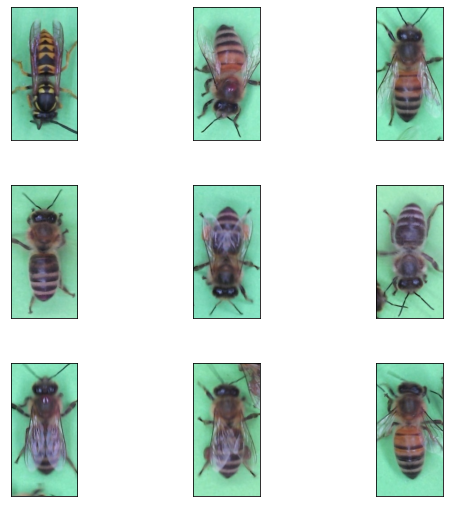

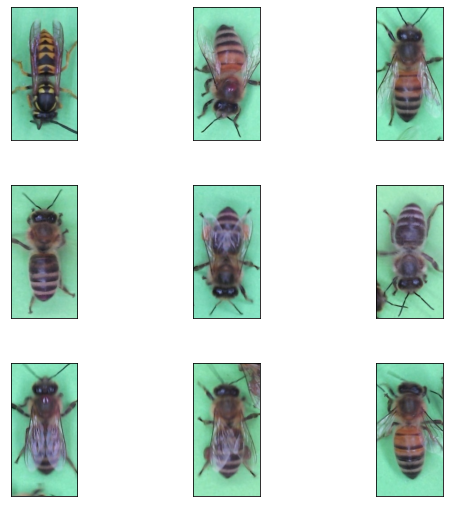

In [ ]:
tfds.show_examples(bee_ds,bee_info)

# 2. **Exploratory Data Analysis**

Before starting the EDA task, the bee dataset will be converted to a dataframe in order to ease the EDA phase. Alongi

In [ ]:
bee_df = tfds.as_dataframe(bee_ds,bee_info)

In [ ]:
bee_df.columns

Index(['input', 'output/cooling_output', 'output/pollen_output',
       'output/varroa_output', 'output/wasps_output'],
      dtype='object')

Our dataset is composed by the input or X that corresponds to the images and we have 4 target binary variables.

In [ ]:
print("Size of a image:",bee_df['input'][0].shape)

Size of a image: (150, 75, 3)


The images have a size of 300x150 and as expected are on rgb.

In [ ]:
#Checking for Missing values
bee_df.isna().value_counts()

input  output/cooling_output  output/pollen_output  output/varroa_output  output/wasps_output
False  False                  False                 False                 False                  7490
dtype: int64

In [ ]:
def convert_to_grayscale(img):
  #Convert to tensor
  tensor_img = tf.convert_to_tensor(img)
  #Convert from rgb to grayscale
  img_bw = tf.image.rgb_to_grayscale(tensor_img)

  return img_bw

In [ ]:
def hash_image(img):
  img_bw = convert_to_grayscale(img)
  #Hash Image
  #hash_img = str(imagehash.phash(tf.keras.utils.array_to_img(img_bw.numpy())))
  hash_img = str(imagehash.phash(tf.keras.preprocessing.image.array_to_img(img_bw.numpy())))
  return hash_img

Check Duplicates

In [ ]:
#Checking for duplicated images
counts_imgs = dict()
arr_dups = list()
#Loop over images
for i, img in enumerate(bee_df['input'].values):
  #hash image
  hash_img = hash_image(img)
  #Add to dataframe
  bee_df.loc[i,'hash'] = hash_img


In [ ]:
"""
get_image: Plots image  
Arguments:
  df = DataFrame where images are stored
  img_index = position of image
  axe = pass axe to plot if subplots are needed
"""
def plot_image(df,img_index,axe=None):
    if axe is not None:
      #axe.imshow(tf.keras.utils.array_to_img(df.loc[img_index,'input']))
      axe.imshow(tf.keras.preprocessing.image.array_to_img(df.loc[img_index,'input']))
    else:
      #plt.imshow(tf.keras.utils.array_to_img(df.loc[img_index,'input']))
      plt.imshow(tf.keras.preprocessing.image.array_to_img(df.loc[img_index,'input']))
      plt.show()

In [ ]:
#Loop over array of indexes of duplicated images
dups = bee_df.index[bee_df.duplicated(subset=['hash'],keep=False)]

for i in range(0,len(dups)-1,2):
  #Set axis to plot images
  fig, (ax1, ax2) = plt.subplots(1,2)
  #Set title
  fig.suptitle("Duplicated Images")
  #Plot images
  plot_image(bee_df,dups[i],ax1)
  plot_image(bee_df,dups[i+1],ax2)
  

In [ ]:
"""
plot_class_counts: Plots a barplot with the respective number of instances existed on the dataset for a given target variable
Arguments:
  df = DataFrame to perform the counting (pd.DataFrame)
  target = target variable/class to count the number of examples (string)
  title = title of the plot (string)
  labels = labels to be plotted on the x axis (list of strings)
"""
def plot_class_counts(df,target,title,labels):
  fig,ax = plt.subplots(figsize=(6,6))
  blist = plt.bar(labels,df.value_counts(subset=[target]),color=['#30A5BF','#F2BE22'])
  #blist[1].set_color('y')
  plt.title(title)
  total = len(df[target])
  for p in ax.patches:
      #Get percentages for classes
          percentage = '{:.1f}%'.format(100 * (p.get_height()/total))
          x = p.get_x() + p.get_width()/2 - 0.05
          y = p.get_y() + p.get_height() + 75
          ax.annotate(percentage, (x, y))
      #Get absolute values for classes
          x = p.get_x() + p.get_width()/2 - 0.05
          y = p.get_y() + p.get_height()/2
          ax.annotate(p.get_height(),(x,y))


In [ ]:
plot_class_counts(bee_df,'output/wasps_output','Number of images of bees and wasps',['bees','wasps'])

Analysing the graphic, clearly there is an imbalanced of classes, where 87.3% of dataset is composed by bees' images and only 12.7% of the images correspond to wasps.

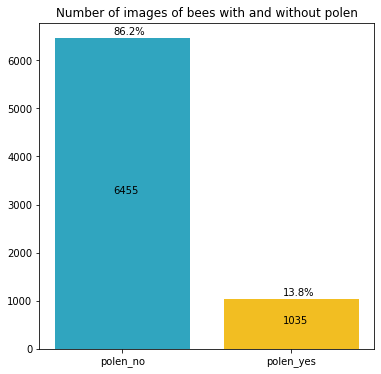

In [ ]:
plot_class_counts(bee_df,'output/pollen_output','Number of images of bees with and without polen',['polen_no','polen_yes'])

Similarly, to the previous situations, there is another imbalance of classes regarding the images that polen is present or not. Existing only 1035 images where this is true.  

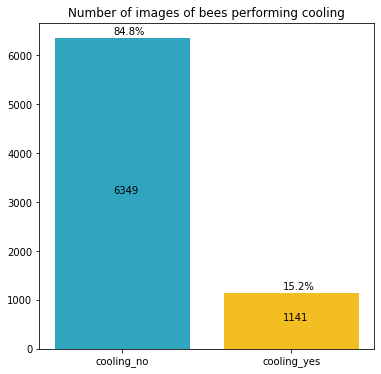

In [ ]:
plot_class_counts(bee_df,'output/cooling_output','Number of images of bees performing cooling',['cooling_no','cooling_yes'])

For the cooling target variable, it exists another imbalance of classes, where 15.2% of images corresponds to bees performing the cooling process.

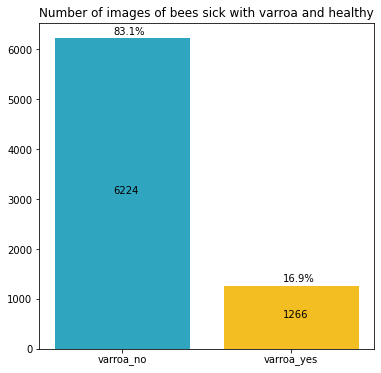

In [ ]:
plot_class_counts(bee_df,'output/varroa_output','Number of images of bees sick with varroa and healthy',['varroa_no','varroa_yes'])

Again, for the varroa, sickness, target variable, it is verified another imbalance of classes, where 16.2% of images corresponds to bees sick with the varroa.

In [ ]:
bee_info_df = bee_df[['output/cooling_output','output/pollen_output','output/varroa_output','output/wasps_output']]
bee_info_df['sum'] = bee_df[['output/cooling_output','output/pollen_output','output/varroa_output','output/wasps_output']].sum(axis = 1)
print(len(bee_info_df[bee_info_df['sum'] >1]), "Observations with more than a caracteristic","\n")

# na tabela pivot table vemos um resumo das possíveis combinaçoes entre variáveis dependentes.
print(pd.crosstab(bee_info_df['output/cooling_output'],bee_info_df['output/pollen_output']),"\n")
print(pd.crosstab(bee_info_df['output/cooling_output'],bee_info_df['output/varroa_output']),"\n")
print(pd.crosstab(bee_info_df['output/pollen_output'],bee_info_df['output/varroa_output']),"\n")
print(pd.crosstab(bee_info_df['output/pollen_output'],bee_info_df['output/wasps_output']),"\n")
print(pd.crosstab(bee_info_df['output/wasps_output'],bee_info_df['output/varroa_output']),"\n")
print(pd.crosstab(bee_info_df['output/cooling_output'],bee_info_df['output/wasps_output']),"\n")


159 Observations with more than a caracteristic 

output/pollen_output    0.0  1.0
output/cooling_output           
0.0                    5407  942
1.0                    1048   93 

output/varroa_output    0.0   1.0
output/cooling_output            
0.0                    5148  1201
1.0                    1076    65 

output/varroa_output   0.0   1.0
output/pollen_output            
0.0                   5190  1265
1.0                   1034     1 

output/wasps_output    0.0  1.0
output/pollen_output           
0.0                   5506  949
1.0                   1034    1 

output/varroa_output   0.0   1.0
output/wasps_output             
0.0                   5274  1266
1.0                    950     0 

output/wasps_output     0.0  1.0
output/cooling_output           
0.0                    5400  949
1.0                    1140    1 



From analysing the possibles situations where we might have wasps with polen, or cooling. It was found that this happend for one case of each situation. Furthermore, it was verified that there are 93 cases where cooling and polen target variables were true.

Therefore, we consider this outliers each demand our attention to handle them carefully.

In [ ]:
"""
get_plot_outliers: Selects and plots the images of the outliers identified
Arguments:
  df = DataFrame (pandas.DataFrame)
  target1 = target variable/class (string)
  target2 = target variable/class (string)
"""
def get_plot_outliers(df,target1,target2):
  #Get Index or array of indexes where condition is true
  idx = bee_df.index[(bee_df[target1]==1.0) & (bee_df[target2]==1.0)]
  #Loop over the indexes
  for i in idx:
    #Plot image
    plt.imshow(tf.keras.utils.array_to_img(bee_df.loc[i,'input']))
    plt.show()

IMAGEM ERRADA

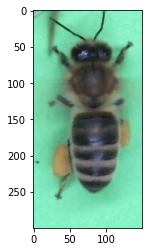

In [ ]:
#Get example where wasp is true and polen is true
get_plot_outliers(bee_df,'output/wasps_output','output/pollen_output')

IMAGEM ERRADA

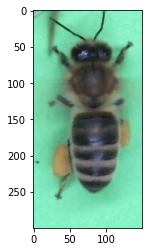

In [ ]:
#Get example where wasp is true and cooling is true
get_plot_outliers(bee_df,'output/wasps_output','output/cooling_output')

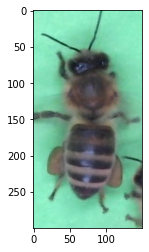

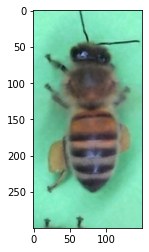

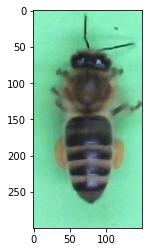

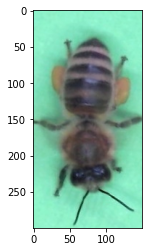

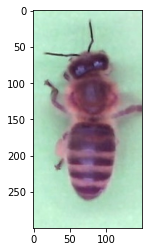

...

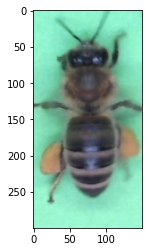

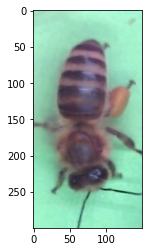

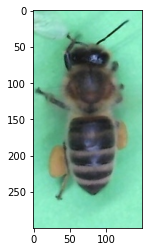

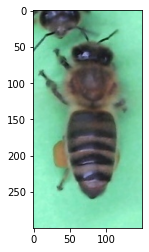

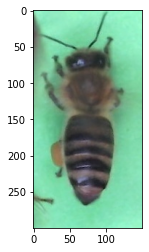

In [ ]:
#Get example where pollen is true and cooling is true
get_plot_outliers(bee_df,'output/pollen_output','output/cooling_output')

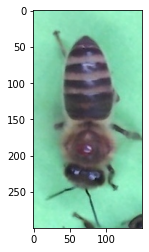

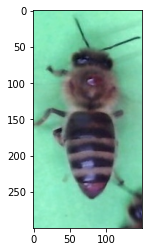

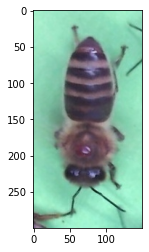

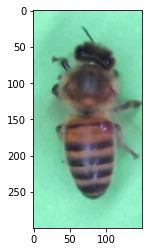

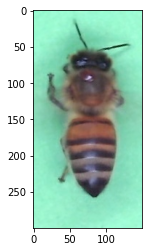

...

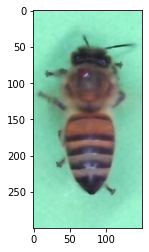

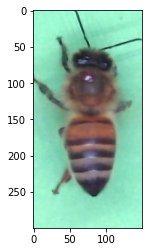

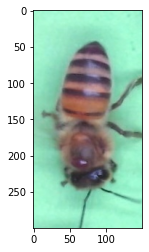

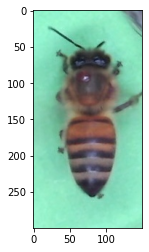

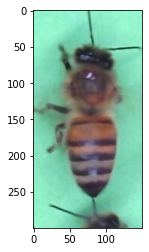

In [ ]:
#Get example where varroa is true and cooling is true
get_plot_outliers(bee_df,'output/varroa_output','output/cooling_output')

# 3.1 **Pre-Processing Data**




### Fix The imbalance dataset

Normalization of images

In [ ]:
bee_df['input'] = bee_df['input'].apply(lambda x: (x / 255).astype(np.float32))

Remove Duplicates

In [ ]:
bee_df = bee_df.drop(dups)

Remover Imagem errada

In [ ]:
idx = bee_df.index[(bee_df['output/wasps_output']==1.0) & (bee_df['output/pollen_output']==1.0) & (bee_df['output/cooling_output']==1.0)]
bee_df = bee_df.drop(idx)

Create target column for multi classification

In [ ]:
for i, val in enumerate(bee_df.values[:,1:3]):
  if val[0] == 0.0 and val[1] == 0.0:
    bee_df.loc[i,'bee_job'] = 0.0
  elif val[0] == 1.0 and val[1] == 0.0:
    bee_df.loc[i,'bee_job'] = 1.0
  elif val[0] == 0.0 and val[1] == 1.0:
    bee_df.loc[i,'bee_job'] = 2.0
  elif val[0] == 1.0 and val[1] == 1.0:
    bee_df.loc[i,'bee_job'] = 3.0

Blobs

In [ ]:
def convert_rgb_gray(img):
  return rgb2gray(img)

In [ ]:
def binarize_image(img,threshold):
  img_binarize = img > threshold
  return img_binarize

In [ ]:
def detect_blobs(data):
  blobs = list()
  for i in data.index:
    #Detect blobs
    img_bw = convert_rgb_gray(data[i])
    img_binarize = binarize_image(img_bw,0.6)
    #blob_doh(img_binarize,max_sigma=40,threshold=0.01
    blobs.append({"blobs":blob_doh(img_binarize,min_sigma=20,max_sigma=40,threshold=0.01),
                  "img_index":i})
  return blobs

In [ ]:
def plot_blobs(data,arr_blobs):
  for i in range(len(data)):
    img_bw = convert_rgb_gray(data[i])
    img_binarize = binarize_image(img_bw,0.6)
    fig, ax = plt.subplots(1,1,figsize=(10,5))
    plt.imshow(img_binarize,cmap='gray')
    for i, blobs in enumerate(arr_blobs):
      for blob in blobs:
        y,x, area = blob
        ax.add_patch(plt.Circle((x, y), area, color='r', 
                                fill=False))
      plt.show()

X,y são as coordenas centrais do blob
Através da área conseguimos encontrar o raio
Através da soma do raio às coordenas conseguimos selecionar os pixels dentro do blob

ter em atenção situações exceção quando a subtração de x-r ou y-r é um número negativo

In [ ]:
def get_blobs_area(data,blobs_df):
  img_blobs_area = list()
  arr_blobs,index = blobs_df['blobs'].values,blobs_df['img_index'].values
  for i,blobs in enumerate(arr_blobs):
    for blob in blobs:
      #x,y,area = blob
      x = blob[0].astype(np.int64)
      y = blob[1].astype(np.int64)
      area = blob[2]
      r = np.ceil(np.sqrt(area/np.pi)).astype(np.int64)
      #print("x:{},y:{},r:{}".format(x,y,r))
      r = r + np.ceil(2*np.pi*r).astype(np.int64)
      if x > r:
        idx_rows = np.s_[x-r:x+r]
      else:
        idx_rows = np.s_[x:x+r]
      
      if y > r:
        idx_cols = np.s_[y-r:y+r]
      else:
        idx_cols = np.s_[y:y+r]
      
      img_blobs_area.append({"blob_area":data[index[i]][idx_rows,idx_cols],"img_index":index[i]})
  return img_blobs_area

In [ ]:
def plot_image_blob_area(data,blobs_area):
  for i in range(len(data)):
    for area in blobs_area:
      plt.imshow(area)
      plt.show()

Number of images: 3258


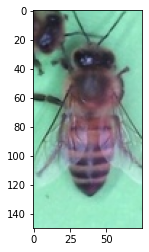

In [ ]:
bee_only_df = bee_df.loc[(bee_df['output/wasps_output'] == 0.0) &
                        (bee_df['output/pollen_output'] == 0.0 )&
                        (bee_df['output/cooling_output'] == 0.0) &
                        (bee_df['output/varroa_output'] == 0.0)]
#bee_only_df = bee_only_df.drop(columns=['output/cooling_output','output/pollen_output','output/varroa_output'])
plt.imshow(bee_only_df['input'].values[0])
print("Number of images:", len(bee_only_df.values))

In [ ]:
blobs_df = pd.DataFrame(detect_blobs(bee_only_df['input']))

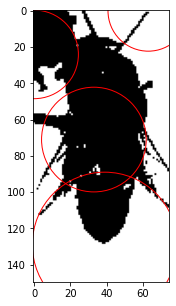

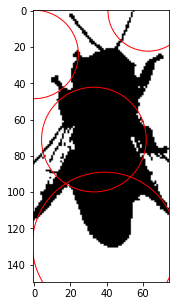

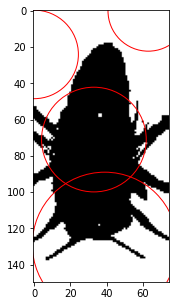

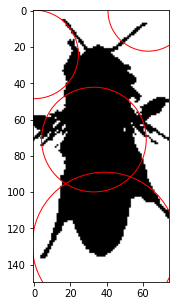

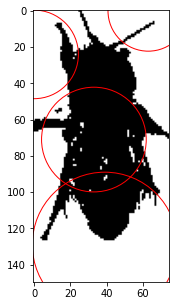

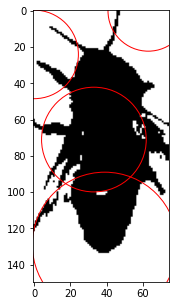

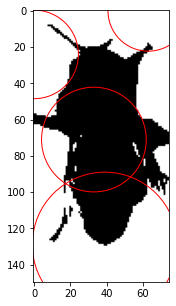

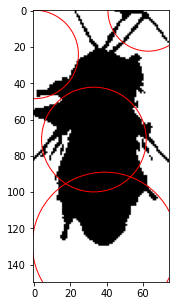

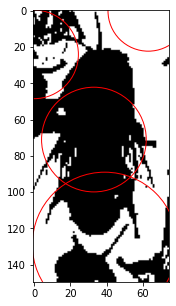

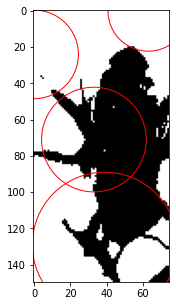

In [ ]:
plot_blobs(bee_only_df['input'].head(10).values,blobs_df['blobs'])

In [ ]:
blobs_area_df = pd.DataFrame(get_blobs_area(bee_only_df['input'],blobs_df))
blobs_area_df

,blob_area,img_index
0,"[[[0.5411765, 0.8509804, 0.7254902], [0.541176...",0
1,"[[[0.5529412, 0.78039217, 0.6862745], [0.56862...",0
2,"[[[0.2627451, 0.24313726, 0.22745098], [0.2980...",0
3,"[[[0.43529412, 0.654902, 0.54901963], [0.18039...",0
4,"[[[0.5176471, 0.7607843, 0.6627451], [0.537254...",4
...,...,...
13015,"[[[0.46666667, 0.81960785, 0.6784314], [0.4470...",7482
13016,"[[[0.49411765, 0.7647059, 0.5803922], [0.48235...",7484
13017,"[[[0.41568628, 0.34509805, 0.30588236], [0.356...",7484
13018,"[[[0.53333336, 0.85490197, 0.6745098], [0.5372...",7484


In [ ]:
plot_image_blob_area(bee_only_df['input'].head(10),blobs_area_df['blob_area'])

Clustering blobs

In [ ]:
#resize images
x_resized = list()
for i in range(len(blobs_area_df['blob_area'])):
  #img = tf.convert_to_tensor(np.asarray(blobs_area_df['blob_area'][i]).astype(np.float32) / 255)
  img = convert_to_grayscale(blobs_area_df['blob_area'][i])
  img = tf.image.resize(img,[40,40],method='bilinear').numpy().flatten()
  x_resized.append(img)

In [ ]:
x_resized = np.asarray(x_resized)

In [ ]:
kmeans = KMeans(n_clusters=2,random_state=0)
kmeans.fit(x_resized)

KMeans(n_clusters=2, random_state=0)

In [ ]:
def get_cluster_idx(labels,cluster_label):
  return np.where(labels == cluster_label)

In [ ]:
def plot_examples_on_cluster(idx_cluster,cluster_label,n):
  print("Cluster {}".format(cluster_label))
  for i,val in enumerate(idx_cluster[:n]):
    plt.imshow(blobs_area_df['blob_area'][val])
    plt.show()

In [ ]:
idx_cluster0 = get_cluster_idx(kmeans.labels_,0)[0]
idx_cluster1 = get_cluster_idx(kmeans.labels_,1)[0]

In [ ]:
#for i in range(len(kmeans.labels_[:1000])-5):
  #print(kmeans.labels_[i:i+5])

for i in range(len(kmeans.labels_[:1000])):
  print("Cluster:{},img_index:{}".format(kmeans.labels_[i],blobs_area_df.loc[i,'img_index']))

### Cluster 0

Cluster 0


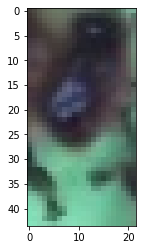

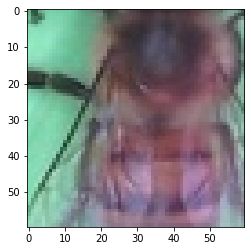

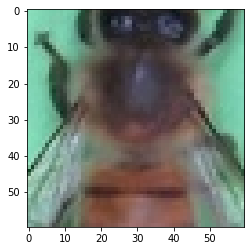

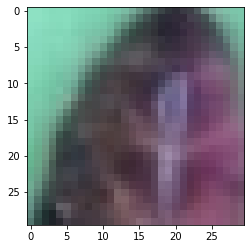

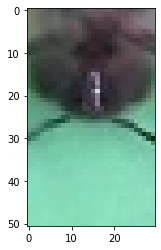

...

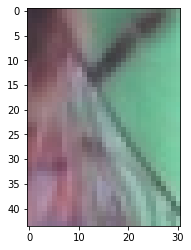

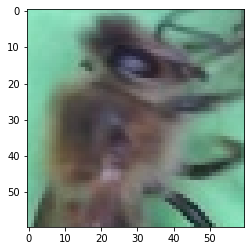

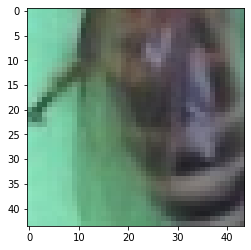

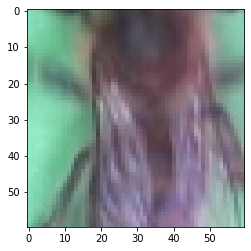

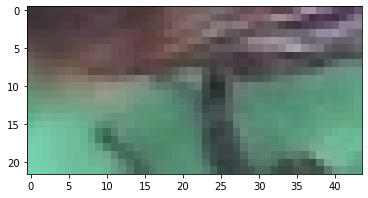

In [ ]:
plot_examples_on_cluster(idx_cluster0,0,100)

### Cluster 1

Cluster 1


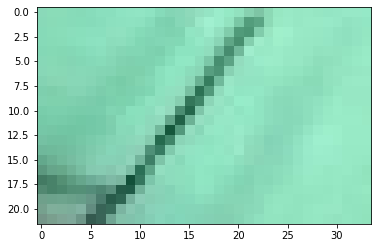

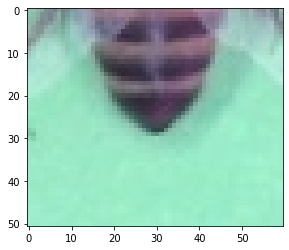

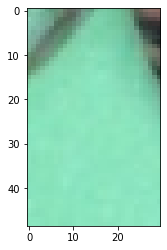

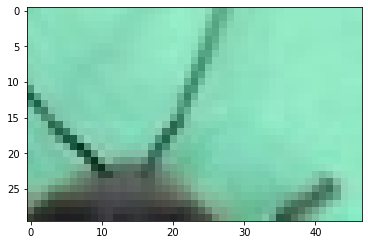

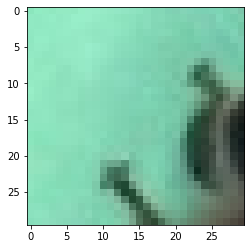

...

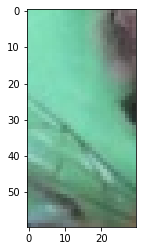

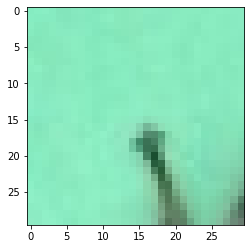

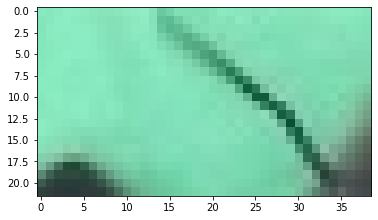

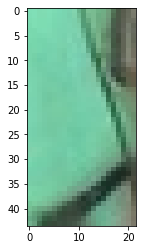

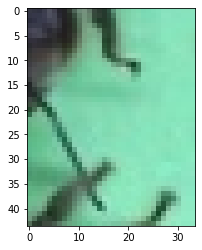

In [ ]:
plot_examples_on_cluster(idx_cluster1,1,100)

Eliminar Imagens do Cluster 0

In [ ]:
idx_imgs_cluster1 = np.unique(blobs_area_df.loc[idx_cluster0,'img_index'].values)
bee_df = bee_df.drop(idx_imgs_cluster1)

In [ ]:
bee_df.value_counts(subset=['output/wasps_output'])

output/wasps_output
0.0                    3434
1.0                     949
dtype: int64

In [ ]:
print(len(bee_df.loc[(bee_df['output/wasps_output']==0) & (bee_df['output/pollen_output'] == 0.0 )&
                        (bee_df['output/cooling_output'] == 0.0) &
                        (bee_df['output/varroa_output'] == 0.0)].values))

156


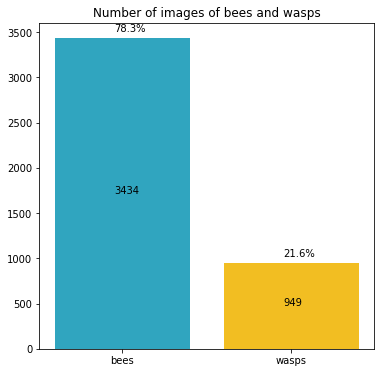

In [ ]:
plot_class_counts(bee_df,'output/wasps_output','Number of images of bees and wasps',['bees','wasps'])

In [ ]:
plot_class_counts(bee_df,'output/pollen_output','Number of images of bees with and without polen',['polen_no','polen_yes'])

Train-Test split

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(bee_df['input'].values,bee_df[bee_df.columns[1:]].values,test_size=0.33, random_state=0)

In [ ]:
bee_df_train = pd.DataFrame({'input':X_train})
bee_df_train['output/cooling_output'] = y_train[:,0]
bee_df_train['output/pollen_output'] = y_train[:,1]
bee_df_train['output/varroa_output'] = y_train[:,2]
bee_df_train['output/wasps_output'] =  y_train[:,3]
bee_df_train['bee_job'] =  y_train[:,5] #y_train[:,4]

In [ ]:
bee_df_test = pd.DataFrame({'input':X_test})
bee_df_test['output/cooling_output'] = y_test[:,0]
bee_df_test['output/pollen_output'] = y_test[:,1]
bee_df_test['output/varroa_output'] = y_test[:,2]
bee_df_test['output/wasps_output'] =  y_test[:,3]
bee_df_test['bee_job'] =  y_test[:,5]

In [ ]:
bee_df_train

,input,output/cooling_output,output/pollen_output,output/varroa_output,output/wasps_output,bee_job
0,"[[[0.52156866, 0.88235295, 0.7372549], [0.5176...",0.0,0.0,1.0,0.0,0.0
1,"[[[0.5803922, 0.9254902, 0.7764706], [0.580392...",0.0,1.0,0.0,0.0,2.0
2,"[[[0.5764706, 0.93333334, 0.7607843], [0.57647...",1.0,0.0,0.0,0.0,0.0
3,"[[[0.57254905, 0.9529412, 0.78431374], [0.5647...",1.0,0.0,0.0,0.0,0.0
4,"[[[0.59607846, 0.83137256, 0.72156864], [0.607...",0.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...
2934,"[[[0.5294118, 0.88235295, 0.73333335], [0.5176...",0.0,0.0,0.0,1.0,0.0
2935,"[[[0.5411765, 0.8862745, 0.7294118], [0.529411...",0.0,0.0,0.0,0.0,0.0
2936,"[[[0.5294118, 0.93333334, 0.7647059], [0.51764...",1.0,0.0,0.0,0.0,1.0
2937,"[[[0.5411765, 0.8980392, 0.76862746], [0.54117...",1.0,0.0,0.0,0.0,0.0


Data Augmentation

In [ ]:
def data_augmentation(ds,labels,n):
  if n > len(ds):
    raise Exception("n argument is bigger than sample size")
  ds = tf.data.Dataset.from_tensor_slices((tf.convert_to_tensor(ds[:n]),tf.convert_to_tensor(labels[:n])))
  data_augmentation = tf.keras.Sequential([
                              layers.RandomFlip("horizontal_and_vertical"),
                              #layers.RandomRotation(0.1),
                              layers.RandomContrast(0.3),
                              layers.RandomTranslation(0.1,0.1)
                              #layers.Input(shape=(150,75,3)),
                              #layers.experimental.preprocessing.RandomFlip('horizontal_and_vertical'),
                              #layers.experimental.preprocessing.RandomContrast(0.3),
                              #layers.experimental.preprocessing.RandomTranslation(0.1,0.1)
                              
  ])

  ds = ds.map(lambda x,y:(data_augmentation(x,training=True),y))
  return ds

In [ ]:
def assign_ds_to_df(df,ds):
  temp = list()
  for i, (x,y) in enumerate(ds):
    temp.append({"input":x.numpy(),
            'output/cooling_output':y.numpy()[0],
            'output/pollen_output':y.numpy()[1],
            'output/varroa_output':y.numpy()[2],
            'output/wasps_output':y.numpy()[3]})

  temp_df = pd.DataFrame(temp)
  
  return pd.concat([df,temp_df],ignore_index=True)

In [ ]:
def augment_data(df,cond,n):
  ds = np.asarray(df.loc[cond,'input'].tolist()).astype(np.float32)
  labels = np.asarray(df.loc[cond,df.columns[1:]]).astype(np.float32)
  data_aug = data_augmentation(ds,labels,n)
  return assign_ds_to_df(df,data_aug)


Wasp Augmentation

In [ ]:
bee_df_train = augment_data(bee_df_train,(bee_df_train['output/wasps_output'] == 1.0),600)
bee_df_train = augment_data(bee_df_train,(bee_df_train['output/wasps_output'] == 1.0),600)

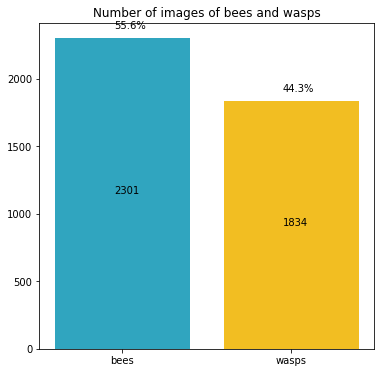

In [ ]:
plot_class_counts(bee_df_train,'output/wasps_output','Number of images of bees and wasps',['bees','wasps'])

Varroa Augmentation

In [ ]:
bee_df_train = augment_data(bee_df_train,(bee_df_train['output/varroa_output'] == 1.0),800)
bee_df_train = augment_data(bee_df_train,(bee_df_train['output/varroa_output'] == 1.0),800)

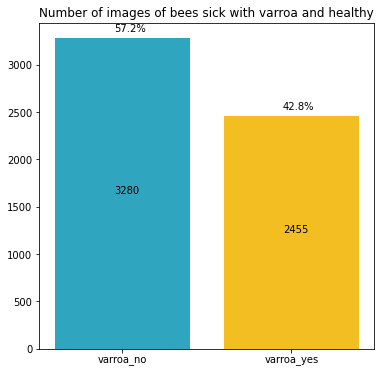

In [ ]:
plot_class_counts(bee_df_train,'output/varroa_output','Number of images of bees sick with varroa and healthy',['varroa_no','varroa_yes'])

Bee job train Augmentation

In [ ]:
for i in range(0,2):
  bee_df_train = augment_data(bee_df_train,(bee_df_train['output/cooling_output'] == 1.0),700)
  bee_df_train = augment_data(bee_df_train,(bee_df_train['output/cooling_output'] == 1.0),700)
  bee_df_train = augment_data(bee_df_train,(bee_df_train['output/pollen_output'] == 1.0),600)
  bee_df_train = augment_data(bee_df_train,(bee_df_train['output/pollen_output'] == 1.0),600)
  bee_df_train = augment_data(bee_df_train,(bee_df_train['output/pollen_output'] == 1.0 )&(bee_df['output/cooling_output'] == 1.0),90)

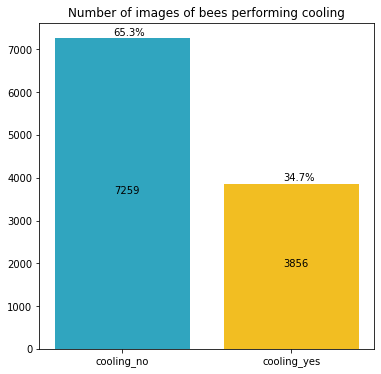

In [ ]:
plot_class_counts(bee_df_train,'output/cooling_output','Number of images of bees performing cooling',['cooling_no','cooling_yes'])

In [ ]:
plot_class_counts(bee_df_train,'output/pollen_output','Number of images of bees with and without polen',['polen_no','polen_yes'])

## Classification

In [ ]:
def create_ds(train,cond_train,target,isSeries=True):
  X_train = np.asarray(list(train.loc[cond_train,'input'])).astype(np.float32)
  #X_test = np.asarray(list(test.loc[cond_test,'input'])).astype(np.float32)
  
  if isSeries:
    y_train = np.asarray(list(train.loc[cond_train,target])).astype(np.float32)
    #y_test = np.asarray(list(test.loc[cond_test,target])).astype(np.float32)
  else:
    y_train = np.asarray(list(train.loc[cond_train,target].values)).astype(np.float32)
    #y_test = np.asarray(list(test.loc[cond_test,target].values)).astype(np.float32)

  #return train_ds,test_ds

  return X_train,y_train


Dataset For Binary Classification Bee VS Wasp

In [ ]:
cond_train = (bee_df_train['output/wasps_output'] == 0.0) | (bee_df_train['output/wasps_output'] == 1.0)
#cond_test = (bee_df_test['output/wasps_output'] == 0.0) | (bee_df_test['output/wasps_output'] == 1.0)
#Creation Dataset
#X_train_bee_wasp,y_train_bee_wasp,X_test_bee_wasp,y_test_bee_wasp = create_ds(bee_df_train,bee_df_test,cond_train,cond_test,'output/wasps_output')

#X_train_bee,y_train_bee = (np.asarray(list(bee_df_train.loc[:,'input'])).astype(np.float32),np.asarray(list(bee_df_train.loc[:,'output/wasps_output'])).astype(np.float32))

X_train_bee,y_train_bee = create_ds(bee_df_train,cond_train,'output/wasps_output')

#### Export bee_df_train

In [ ]:
bee_df_train.to_csv('/content/sample_data/bee_df_train.csv', sep = ',')

Dataset For Binary Classification Varroa VS No Varroa

In [ ]:
cond = (bee_df_train['output/varroa_output'] == 0.0) | (bee_df_train['output/varroa_output'] == 1.0)
#cond_test = (bee_df_test['output/wasps_output'] == 0.0) | (bee_df_test['output/wasps_output'] == 1.0)
#Creation Dataset
#X_train_varroa,y_train_varroa,X_test_varroa,y_test_varroa= create_ds(bee_df_train,bee_df_test,cond,'output/varroa_output')
X_train_varroa, y_train_varroa = create_ds(bee_df_train,cond,'output/varroa_output')

Dataset For Multi Classe Classification  Bee Job

In [ ]:
cond = (bee_df_train['output/cooling_output'] == 0.0) | (bee_df_train['output/cooling_output'] == 1.0) | (bee_df_train['output/pollen_output'] == 0.0) | (bee_df_train['output/pollen_output'] == 1.0)
#Creation Dataset
#train_ds_bee_job,val_ds_bee_job = create_ds(bee_df_train,bee_df_test,cond,bee_df_train.columns[1:3],False)
X_train_multi,y_train_multi= create_ds(bee_df_train,cond,bee_df_train.columns[1:3],False)

In [ ]:
#Create target for XGBoost
y_train_bee_job_XGB = np.asarray(list(bee_df_train.loc[(bee_df_train['output/cooling_output'] == 0.0) | (bee_df_train['output/cooling_output'] == 1.0) | (bee_df_train['output/pollen_output'] == 0.0) | (bee_df_train['output/pollen_output'] == 1.0),'bee_job'])).astype(np.float32)

y_test_bee_job_XGB = np.asarray(list(bee_df_test.loc[(bee_df_test['output/cooling_output'] == 0.0) | (bee_df_test['output/cooling_output'] == 1.0) | (bee_df_test['output/pollen_output'] == 0.0) | (bee_df_test['output/pollen_output'] == 1.0),'bee_job'])).astype(np.float32)

TRAIN MODELS
CNN - Exemplo da aula


Se não tiver Dense como é que faz o backpropogation?



HyperParams:

- Batch Size
- Kernel number/size
- Numero de camadas / Neuronios por Camada
- 

In [ ]:
def create_model(instructions,dims):
  model = tf.keras.Sequential()
  model.add(layers.Input(shape=dims))
  for instruct in instructions:
    for key in instruct:
      if key == 'Conv2D':
        model.add(layers.Conv2D(instruct[key][0],instruct[key][1],padding='same',activation='relu'))
      elif key == 'BatchNormalization':
        model.add(layers.BatchNormalization(momentum =instruct[key][0],epsilon=instruct[key][1]))
      elif key == 'MaxPooling2D':
        model.add(layers.MaxPooling2D(instruct[key][0]))
      elif key == 'Dropout':
        model.add(layers.Dropout(instruct[key][0]))
      elif key == 'Dense':
        model.add(layers.Dense(instruct[key][0],activation=instruct[key][1]))
      elif key == 'Flatten':
        model.add(layers.Flatten(name=instruct[key][0]))
      else:
        raise Exception("Provide one the following layer types: [Conv2D, BatchNormalization, MaxPooling, Dropout, Dense, Flatten]")
  return model

Cross-validation

In [ ]:
params = {'filters__Conv2D':[[16,32,64,128],[8,16,32,64]],
          'kernel_size__Conv2D': [2,3],
          'momentum__BatchNormalization':[0.2],
          'epsilon__BatchNormalization':[1e-4],
          'pool_size__MaxPooling2D':[2],
          'rate__Dropout':[0.2,0.4],
          'units__Dense': [1],
          'activation__Dense': ['relu'],
          'name__Flatten':['flatten_layer']}
dims = (150,75,3)

In [ ]:
def grid_search(params):
  combinations = list(product(*(params[key] for key in params)))
  models = list()
  for comb in combinations:
    model_def = [
                    {'Conv2D':[comb[0][0],comb[1]]},
                    {'BatchNormalization':[comb[2],comb[3]]},
                    {'Conv2D':[comb[0][1],comb[1]]},
                    {'BatchNormalization':[comb[2],comb[3]]},
                    {'MaxPooling2D':[comb[4]]},
                    {'Conv2D':[comb[0][2],comb[1]]},
                    {'Conv2D':[comb[0][2],comb[1]]},
                    {'Conv2D':[comb[0][2],comb[1]]},
                    {'MaxPooling2D':[comb[4]]},
                    {'Conv2D':[comb[0][2],comb[1]]},
                    {'Conv2D':[comb[0][2],comb[1]]},
                    {'Conv2D':[comb[0][2],comb[1]]},
                    {'MaxPooling2D':[comb[4]]},
                    {'Conv2D':[comb[0][3],comb[1]]},
                    {'Conv2D':[comb[0][3],comb[1]]},
                    {'Conv2D':[comb[0][3],comb[1]]},
                    {'MaxPooling2D':[comb[4]]},
                    {'Dropout':[comb[5]]},
                    {'Flatten':[comb[8]]},
                    {'Dense':[comb[6],comb[7]]}
                 ]
    models.append(model_def)
  return models
  #return model with combination of params

In [ ]:
tf.config.experimental_run_functions_eagerly(True)

In [ ]:
def cv(X,y,params,cv_splits,dims=None,isNN=True):
  #***CNN****
  if isNN:
    kf = KFold(n_splits=cv_splits,shuffle=True,random_state=0)
    history_models = list()
    models_def = grid_search(params)
    for i, model_def in enumerate(models_def):
      #Clear model from memory
      tf.keras.backend.clear_session()
      #Create Model
      model = create_model(model_def,dims)
      #Name Model
      model._name = 'cnn_{}'.format(i)
      #Compile Model
      model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
                loss=tf.keras.losses.BinaryCrossentropy(),
                metrics=['accuracy'])
      #Save initial weights to reset after each fold
      model.save_weights('initial_weights.h5')
      print(model.summary())
      i=0
      for train_idx,test_idx in kf.split(X):
        print("Fold number:",i)
        #Reset Weights
        model.load_weights('initial_weights.h5')
        #get train-test set
        X_train, y_train = X[train_idx], y[train_idx]
        X_test, y_test = X[test_idx], y[test_idx]
        batch_values = np.arange(50,150,25)
        #for batch in batch_values:
        #Fit model
        epochs = 5
        history = model.fit(
          x=X_train,
          y=y_train,
          validation_data=(X_test,y_test),
          epochs=epochs,
          batch_size = 90
        )
        i+=1
        history_models.append({'model_name':model.name,'model_def':model_def,'history':history})
    return history_models
  #***XGBOOST******
  else:
    xgb = XGBClassifier(eval_metric='error')
    gcv = GridSearchCV(xgb,params,cv=cv_splits)
    gcv.fit(X,y)
    return gcv.cv_results_

In [ ]:
def get_scores(history,n_splits):
    hist_df = pd.DataFrame(history)
    scores = list()
    for i in range(n_splits,len(histories)+n_splits,n_splits):
        vals_accuracy_scores = list()
        vals_loss_scores = list()
        for j in range(i-n_splits,i):
            #Append validation accuracy from last epoch
            vals_accuracy_scores.append(hist_df['history'].values[j].history['val_accuracy'][-1])
            vals_loss_scores.append(hist_df['history'].values[j].history['val_loss'][-1])
        #get model name
        model_name = str(hist_df.loc[i-n_splits,'model_name'])
        #Append metrics according to the performance of each model
        scores.append({"model_name":model_name,
         'val_accuracy_mean':np.mean(vals_accuracy_scores),
         'val_loss_mean':np.mean(vals_loss_scores)})
    return scores

In [ ]:
n_splits = 4
histories = cv(X_train_varroa,y_train_varroa,params,n_splits,dims)

Model: "cnn_0"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 150, 75, 16)       208       
                                                                 
 batch_normalization (BatchN  (None, 150, 75, 16)      64        
 ormalization)                                                   
                                                                 
 conv2d_1 (Conv2D)           (None, 150, 75, 32)       2080      
                                                                 
 batch_normalization_1 (Batc  (None, 150, 75, 32)      128       
 hNormalization)                                                 
                                                                 
 max_pooling2d (MaxPooling2D  (None, 75, 37, 32)       0         
 )                                                               
                                                             

In [ ]:
scores_df = pd.DataFrame(get_scores(histories,n_splits))
scores_df

,model_name,val_accuracy_mean,val_loss_mean
0,cnn_0,0.989117,0.047419
1,cnn_1,0.963717,0.129041
2,cnn_2,0.877415,1.802527
3,cnn_3,0.990327,0.058048
4,cnn_4,0.874967,0.369255
5,cnn_5,0.931057,0.219076
6,cnn_6,0.947766,0.146610
7,cnn_7,0.927694,0.183206


Selecionar modelo cnn_0 porque tem o loss function mais reduzida.

In [ ]:
models_def = grid_search(params)
model_bee = create_model(models_def[0],dims)
model_bee.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
                loss=tf.keras.losses.BinaryCrossentropy(),
                metrics=['accuracy'])

In [ ]:
model_bee.summary()

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_33 (Conv2D)           (None, 150, 75, 16)       208       
_________________________________________________________________
batch_normalization_6 (Batch (None, 150, 75, 16)       64        
_________________________________________________________________
conv2d_34 (Conv2D)           (None, 150, 75, 32)       2080      
_________________________________________________________________
batch_normalization_7 (Batch (None, 150, 75, 32)       128       
_________________________________________________________________
max_pooling2d_12 (MaxPooling (None, 75, 37, 32)        0         
_________________________________________________________________
conv2d_35 (Conv2D)           (None, 75, 37, 64)        8256      
_________________________________________________________________
conv2d_36 (Conv2D)           (None, 75, 37, 64)       

In [ ]:
"""num_classes = 2 # len(class_names)
base_model = Sequential([
  layers.Input(shape=(150, 75, 3)),
  #layers.Rescaling(1./255),
  layers.Conv2D(16, 3, padding='same', activation='relu'),
  layers.BatchNormalization(momentum=0.9, epsilon=1e-5, gamma_initializer="uniform"),
  #layers.MaxPooling2D(pool_size=(3, 3)),
  layers.Conv2D(16, 3, padding='same', activation='relu'),
  layers.BatchNormalization(momentum=0.9, epsilon=1e-5, gamma_initializer="uniform"),
  #layers.MaxPooling2D(pool_size=(3, 3)),
  layers.Conv2D(16, 3, padding='same', activation='relu'),
  layers.BatchNormalization(momentum=0.9, epsilon=1e-5, gamma_initializer="uniform"),
  layers.MaxPooling2D(pool_size=(2, 2)),

  layers.Conv2D(32, 3, padding='same', activation='relu'),
  #layers.BatchNormalization(momentum=0.9, epsilon=1e-5, gamma_initializer="uniform"),
  layers.Conv2D(32, 3, padding='same', activation='relu'),
  #layers.BatchNormalization(momentum=0.9, epsilon=1e-5, gamma_initializer="uniform"),
  layers.Conv2D(32, 3, padding='same', activation='relu'),
  #layers.BatchNormalization(momentum=0.9, epsilon=1e-5, gamma_initializer="uniform"),
  layers.MaxPooling2D(pool_size=(2, 2)),

  layers.Conv2D(64, 3, padding='same', activation='relu'),
  #layers.BatchNormalization(momentum=0.9, epsilon=1e-5, gamma_initializer="uniform"),
  layers.Conv2D(64, 3, padding='same', activation='relu'),
  #layers.BatchNormalization(momentum=0.9, epsilon=1e-5, gamma_initializer="uniform"),
  layers.Conv2D(64, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(pool_size=(2, 2)),

  layers.Conv2D(128, 3, padding='same', activation='relu'),
  #layers.BatchNormalization(momentum=0.9, epsilon=1e-5, gamma_initializer="uniform"),
  layers.Conv2D(128, 3, padding='same', activation='relu'),
  #layers.BatchNormalization(momentum=0.9, epsilon=1e-5, gamma_initializer="uniform"),
  layers.Conv2D(128, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(pool_size=(2, 2)),

  layers.Dropout(0.2),
  layers.Flatten(name='flatten_layer'),
  #layers.Dense(256, activation='relu', name = 'my_dense'),
  layers.Dense(1,activation='relu', name = 'my_dense')
])"""

In [ ]:
"""base_model.compile(optimizer='adam',
              loss=tf.keras.losses.MeanSquaredError(),
              metrics=['accuracy'])"""

In [ ]:
"""base_model.summary()"""

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X_train_bee,y_train_bee,test_size=0.33, random_state=0)

In [ ]:
epochs = 20
#epochs = 50
history = model_bee.fit(
  x=X_train,
  y=y_train,
  validation_data=(X_test,y_test),
  epochs=epochs,
  batch_size = 90
)

Epoch 1/20
31/31 [==============================] - 65s 2s/step - loss: 0.8716 - accuracy: 0.5502 - val_loss: 0.6283 - val_accuracy: 0.6022
Epoch 2/20
31/31 [==============================] - 85s 3s/step - loss: 0.5571 - accuracy: 0.7451 - val_loss: 0.4525 - val_accuracy: 0.8674
Epoch 3/20
31/31 [==============================] - 81s 3s/step - loss: 0.3515 - accuracy: 0.8859 - val_loss: 0.2970 - val_accuracy: 0.9187
Epoch 4/20
31/31 [==============================] - 86s 3s/step - loss: 0.1998 - accuracy: 0.9365 - val_loss: 0.1151 - val_accuracy: 0.9714
Epoch 5/20
31/31 [==============================] - 79s 3s/step - loss: 0.1369 - accuracy: 0.9653 - val_loss: 0.1531 - val_accuracy: 0.9744
Epoch 6/20
31/31 [==============================] - 92s 3s/step - loss: 0.1270 - accuracy: 0.9560 - val_loss: 0.0851 - val_accuracy: 0.9744
Epoch 7/20
31/31 [==============================] - 77s 2s/step - loss: 0.0814 - accuracy: 0.9801 - val_loss: 0.0724 - val_accuracy: 0.9766
Epoch 8/20
31/31 [==

In [ ]:
def plot_train_val(history):
  acc = history.history['accuracy']
  val_acc = history.history['val_accuracy']

  loss = history.history['loss']
  val_loss = history.history['val_loss']

  epochs_range = range(epochs)

  plt.figure(figsize=(8, 8))
  plt.subplot(1, 2, 1)
  plt.plot(epochs_range, acc, label='Training Accuracy')
  plt.plot(epochs_range, val_acc, label='Validation Accuracy')
  plt.legend(loc='lower right')
  plt.title('Training and Validation Accuracy')

  plt.subplot(1, 2, 2)
  plt.plot(epochs_range, loss, label='Training Loss')
  plt.plot(epochs_range, val_loss, label='Validation Loss')
  plt.legend(loc='upper right')
  plt.title('Training and Validation Loss')
  plt.show()

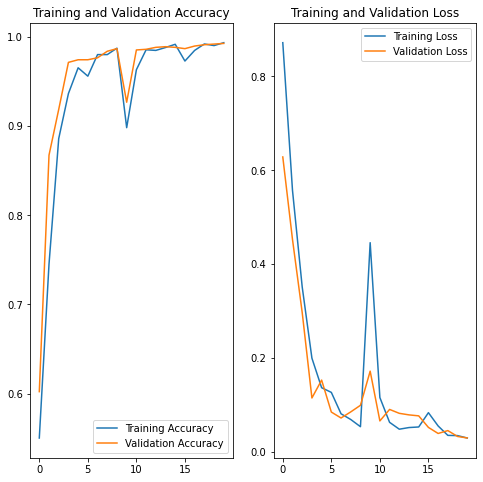

In [ ]:
plot_train_val(history)

In [ ]:
# Extraimos a camada intermédia
layer_name='flatten_layer'
intermediate_layer_model = Model(inputs=model_bee.input,
                                 outputs=model_bee.get_layer(layer_name).output)

In [ ]:
intermediate_output = intermediate_layer_model.predict(X_train) 
intermediate_output = pd.DataFrame(data=intermediate_output)

#intermediate_test_output = intermediate_layer_model.predict(X_test)
#intermediate_test_output = pd.DataFrame(data=intermediate_test_output)

In [ ]:
intermediate_output

,0,1,2,3,4,5,6,7,8,9,...,4598,4599,4600,4601,4602,4603,4604,4605,4606,4607
0,0.0,0.215048,0.0,0.106725,0.570978,0.328454,0.000000,0.0,0.446001,0.000000,...,0.242949,0.174590,0.046147,0.129711,0.036764,0.042189,0.0,0.016853,0.090350,0.0
1,0.0,0.201541,0.0,0.097882,0.349752,0.402462,0.000000,0.0,0.422721,0.000000,...,0.232500,0.166306,0.053374,0.119759,0.038300,0.043920,0.0,0.015139,0.102260,0.0
2,0.0,0.055693,0.0,0.000000,0.052868,0.000000,0.013882,0.0,0.082727,0.027497,...,0.197148,0.177522,0.028454,0.107044,0.034104,0.035624,0.0,0.021062,0.063266,0.0
3,0.0,0.132759,0.0,0.138131,0.302143,0.252774,0.000000,0.0,0.149081,0.000000,...,0.229369,0.167367,0.047262,0.117836,0.043487,0.043114,0.0,0.016886,0.105027,0.0
4,0.0,0.052379,0.0,0.017303,0.099018,0.053158,0.000000,0.0,0.129610,0.000000,...,0.313538,0.327664,0.129389,0.275609,0.034153,0.074557,0.0,0.021261,0.081254,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1360,0.0,0.033573,0.0,0.000000,0.104796,0.023219,0.011125,0.0,0.081992,0.001937,...,0.231179,0.171133,0.048080,0.123583,0.034316,0.035534,0.0,0.015988,0.094484,0.0
1361,0.0,0.247338,0.0,0.047352,0.361769,0.364415,0.000000,0.0,0.311855,0.000000,...,0.242159,0.170806,0.049911,0.125800,0.041591,0.037881,0.0,0.012925,0.110518,0.0
1362,0.0,0.175753,0.0,0.115517,0.552171,0.498405,0.080454,0.0,0.000000,0.000000,...,0.221130,0.167976,0.054188,0.118879,0.040581,0.038289,0.0,0.015264,0.082833,0.0
1363,0.0,0.162016,0.0,0.090789,0.143061,0.299471,0.061431,0.0,0.070556,0.000000,...,0.269821,0.224699,0.080515,0.141033,0.047163,0.075299,0.0,0.019103,0.088573,0.0


In [ ]:
# Extraímos os labels
train_ds2 = train_ds.unbatch()
labels_trn = list(train_ds2.map(lambda x, y: y))

val_ds2 = val_ds.unbatch()
labels_val = list(val_ds2.map(lambda x, y: y))

Hyper Params:

Binary:
Objective: binary:logistics

num_class = 2

max_depth = [1,2,3,4]

n_estimators = 

parametro filas/colunas/linhas

Multi:

'multi:softprob'



In [ ]:
params = {'eta':[0.2,0.3],'gamma':[0,10],'max_depth':np.arange(3,6)}
y_train_xgb = y_train.astype(np.int8)
results = cv(intermediate_output,y_train_xgb,params,n_splits,isNN=False)

In [ ]:
print("Best Params are:",results['params'][np.where(results['mean_test_score'].max())[0][0]])

Best Params are: {'eta': 0.2, 'gamma': 0, 'max_depth': 3}


In [ ]:
# treinamos o XGB
xgbmodel = XGBClassifier(objective='binary:logistic',max_depth = 3,eta=0.2,gamma=0,eval_metric='error')
xgbmodel.fit(intermediate_output, y_train_xgb)
#xgbmodel.score(intermediate_test_output,y_test)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, enable_categorical=False,
              eta=0.2, eval_metric='error', gamma=0, gpu_id=-1,
              importance_type=None, interaction_constraints='',
              learning_rate=0.200000003, max_delta_step=0, max_depth=3,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=8, num_parallel_tree=1, predictor='auto',
              random_state=0, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
              subsample=1, tree_method='exact', validate_parameters=1,
              verbosity=None)

### Validating Model

In [ ]:
X_test[0].shape

(150, 75, 3)

In [ ]:
intermediate_test_output = intermediate_layer_model.predict()

ValueError: Failed to convert a NumPy array to a Tensor (Unsupported object type numpy.ndarray).

In [ ]:
xgbmodel.score(intermediate_test_output,y_test)